In [1]:
%load_ext autoreload
%autoreload 2

import os
os.environ['KMP_WARNINGS'] = 'off'
import sys
import git

import uproot as ut
import awkward as ak
import numpy as np
import math
import vector
import sympy as sp

import re
from tqdm import tqdm
import timeit
import re

sys.path.append( git.Repo('.', search_parent_directories=True).working_tree_dir )
from utils import *

In [2]:
%load_ext line_profiler
%load_ext memory_profiler

In [3]:
# ntuple = "/eos/uscms/store/user/srosenzw/sixb/ntuples/Summer2018UL/maxbtag/NMSSM/NMSSM_XYH_YToHH_6b_MX_1000_MY_600/ntuple.root"
# model = "/uscms/home/srosenzw/nobackup/workarea/higgs/sixb_analysis/CMSSW_10_6_19_patch2/src/sixb/weaver-multiH/weaver/models/exp_xy/XY_3H_reco_ranker/20230220_ranger_lr0.0047_batch1024__withbkg/"

In [4]:
module = fc.eightb.preselection.t8btag_minmass
model = eightb.models.yy_quadh_bkg10_allsig
feynnet = eightb.models.feynnet_bkg10_allsig

In [5]:
altfile='{base}'
feynnet_qcd = ObjIter([Tree(module.Run2_UL18.QCD_B_List, altfile=altfile)])
orignal_qcd = ObjIter([Tree(module.Run2_UL18.QCD_B_List, altfile=altfile)])

100%|██████████| 16/16 [00:10<00:00,  1.58it/s]


In [6]:
orignal_qcd.apply(lambda t : eightb.load_yy_quadh_ranker(t, model.path))


[None]

In [7]:
feynnet_qcd.apply(lambda t : eightb.load_yy_quadh_ranker(t, feynnet.path))


[None]

In [8]:
for qcd in orignal_qcd:
    qcd.sample = 'Org NN QCD'

In [9]:
for qcd in feynnet_qcd:
    qcd.sample = 'FeynNet QCD'

100%|██████████| 2/2 [00:03<00:00,  1.82s/it]


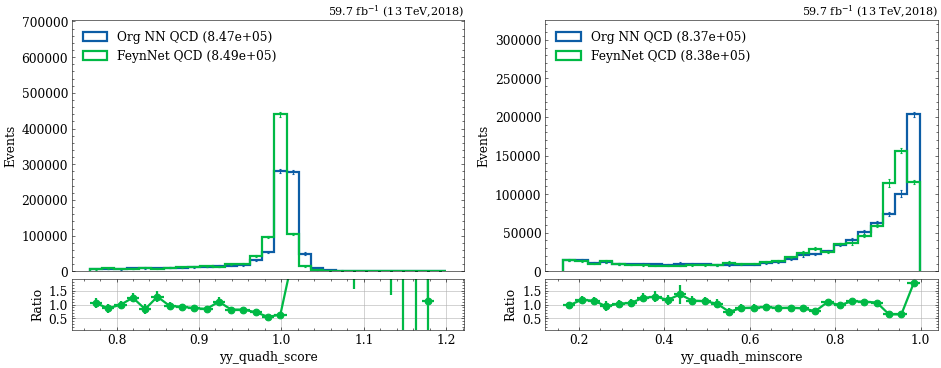

In [10]:
study.quick(
    orignal_qcd + feynnet_qcd,
    stacked=False,
    h_color=None,
    legend=True,
    varlist=['yy_quadh_score','yy_quadh_minscore'],

    ratio=True
)

100%|██████████| 6/6 [00:02<00:00,  2.40it/s]


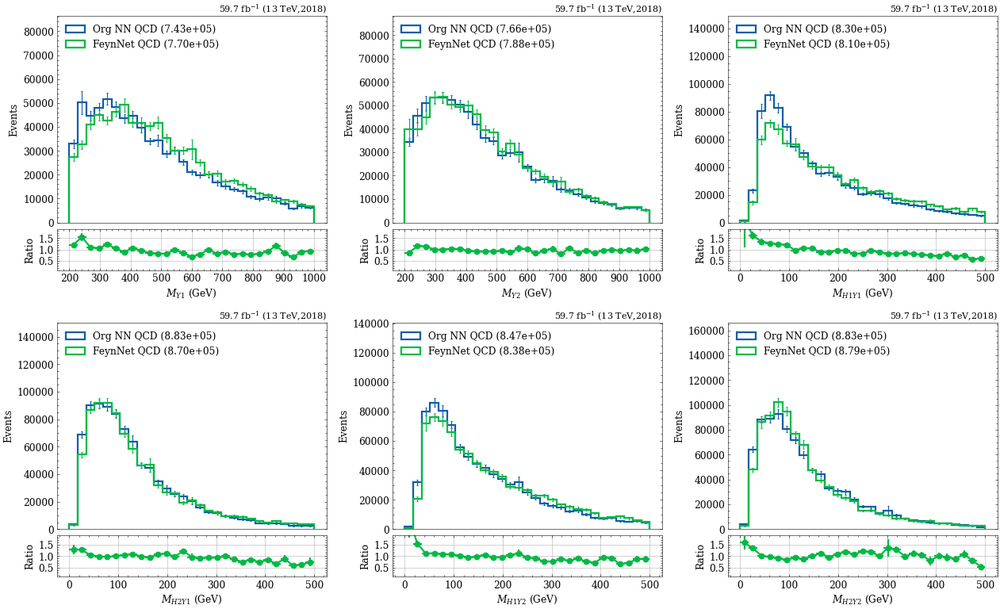

In [11]:
study.quick(
    orignal_qcd + feynnet_qcd,
    stacked=False,
    h_color=None,
    legend=True,
    varlist=['Y1_m','Y2_m','H1Y1_m','H2Y1_m','H1Y2_m','H2Y2_m'],

    ratio=True
)

100%|██████████| 49/49 [02:28<00:00,  3.03s/it]


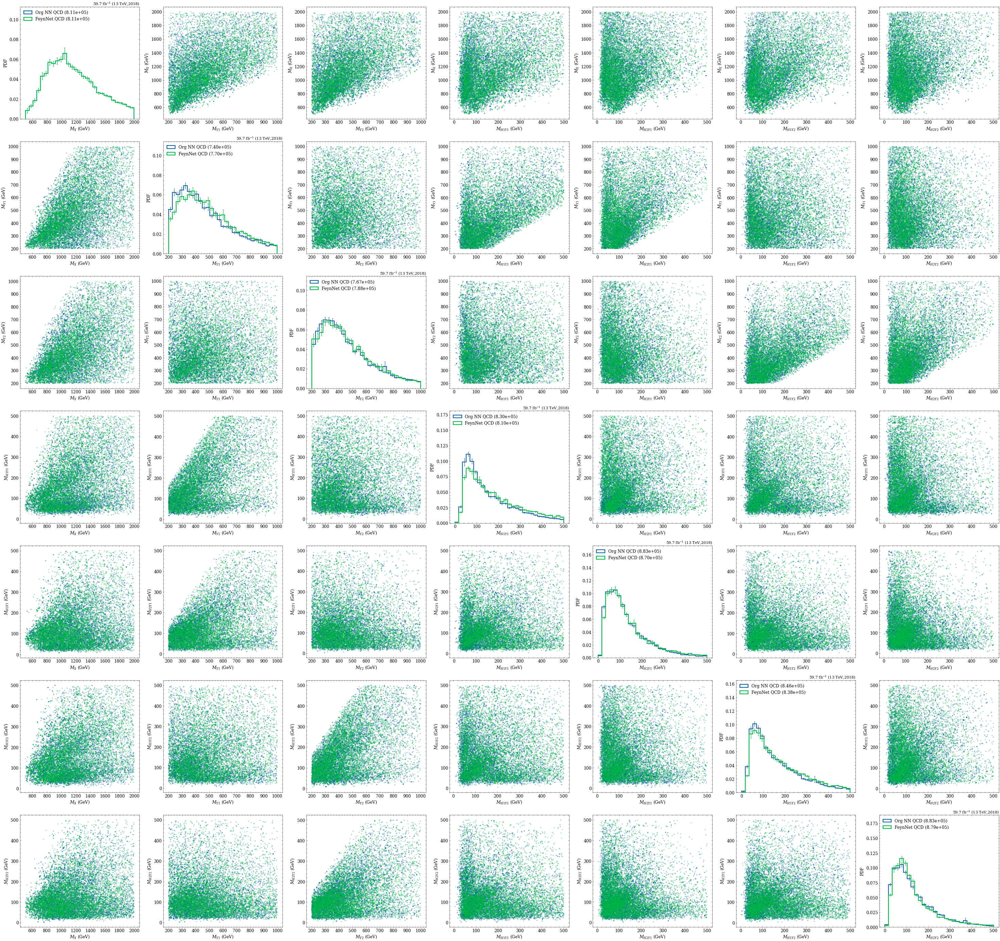

In [12]:
study.pairplot(
    orignal_qcd + feynnet_qcd,
    stacked=False,
    h_color=None,
    legend=True,
    varlist=['X_m','Y1_m','Y2_m','H1Y1_m','H2Y1_m','H1Y2_m','H2Y2_m'],
)

In [12]:
altfile='{base}'
feynnet_sig = ObjIter([Tree(module.NMSSM_XYY_YToHH_8b_MX_1000_MY_450, altfile=altfile)])
orignal_sig = ObjIter([Tree(module.NMSSM_XYY_YToHH_8b_MX_1000_MY_450, altfile=altfile)])

100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


In [13]:
orignal_sig.apply(lambda t : eightb.load_yy_quadh_ranker(t, model.path))

feynnet_sig.apply(lambda t : eightb.load_yy_quadh_ranker(t, feynnet.path))


[None]

In [14]:
for qcd in orignal_sig:
    qcd.sample = 'Org NN Sig'

In [15]:
for qcd in feynnet_sig:
    qcd.sample = 'FeynNet Sig'

100%|██████████| 2/2 [00:00<00:00,  2.01it/s]


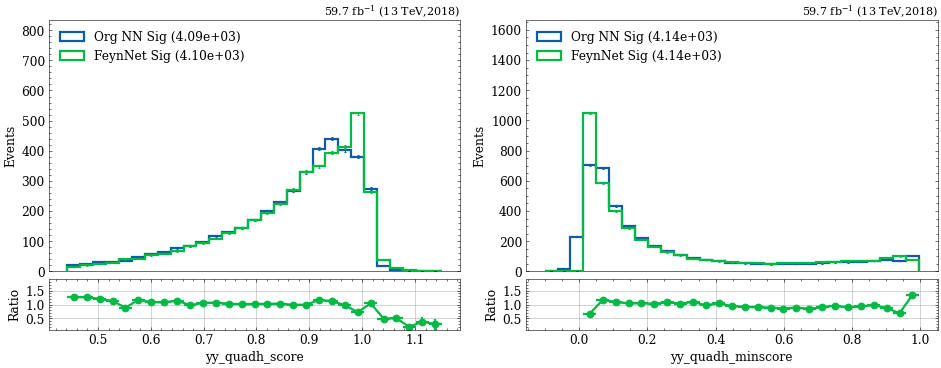

In [16]:
study.quick(
    orignal_sig + feynnet_sig,
    stacked=False,
    h_color=None,
    legend=True,
    varlist=['yy_quadh_score','yy_quadh_minscore'],

    ratio=True
)

100%|██████████| 6/6 [00:00<00:00, 10.45it/s]


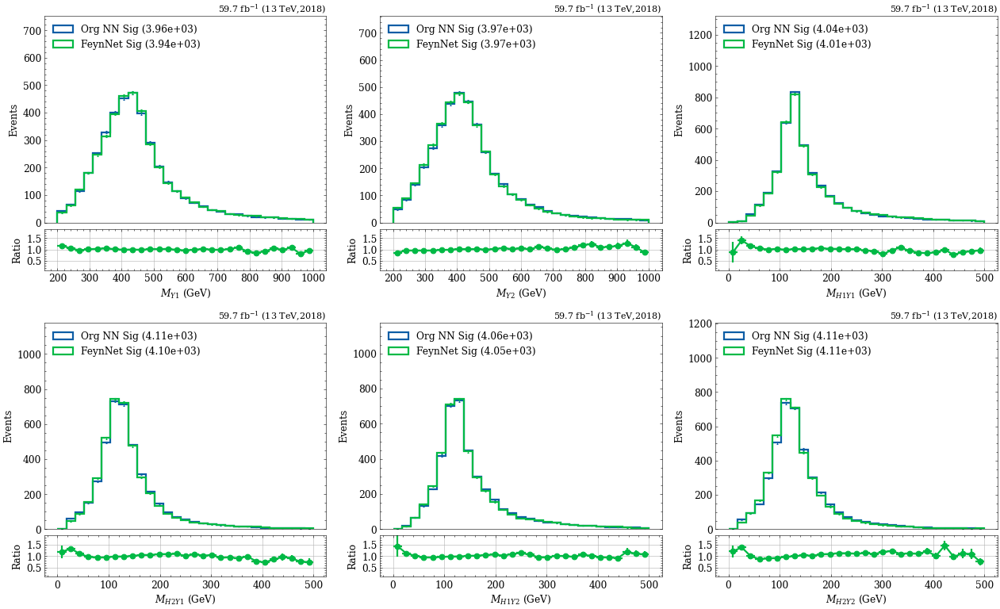

In [17]:
study.quick(
    orignal_sig + feynnet_sig,
    stacked=False,
    h_color=None,
    legend=True,
    varlist=['Y1_m','Y2_m','H1Y1_m','H2Y1_m','H1Y2_m','H2Y2_m'],

    ratio=True
)

In [18]:
def fully_reconstructed(t):
            h_b_ids = [ t[f'{quark}_signalId'] // 2 for quark in eightb.quarklist ]
            y_h_ids = [ ak.where(h_b1_id == h_b2_id, h_b1_id, -1) // 2 for h_b1_id, h_b2_id in zip(h_b_ids[::2], h_b_ids[1::2]) ]
            y1_id, y2_id = [ ak.where(y_h1_id == y_h2_id, y_h1_id, -1) // 2 for y_h1_id, y_h2_id in zip(y_h_ids[::2], y_h_ids[1::2]) ]
            reco_id = ak.where(y1_id == y2_id, y1_id, -1)
            t.extend(
                reco_id = reco_id
            )
(orignal_sig+feynnet_sig).apply(fully_reconstructed)

[None, None]

100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


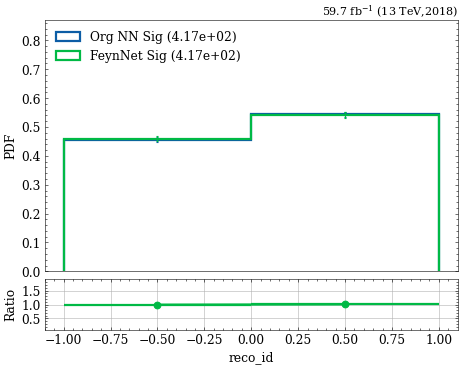

In [19]:
study.quick(
    orignal_sig + feynnet_sig,
    lambda t:t.nfound_select==8,
    stacked=False,
    h_color=None,
    legend=True,
    efficiency=True,
    varlist=['reco_id'],

    ratio=True
)

100%|██████████| 1/1 [00:00<00:00,  9.58it/s]


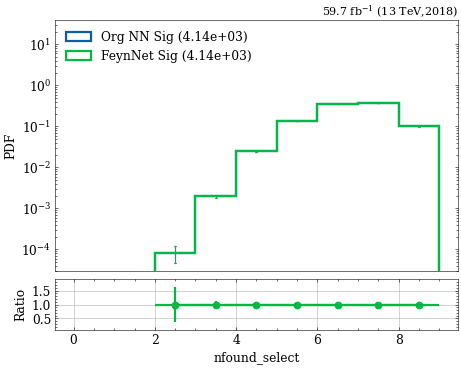

In [21]:
study.quick(
    orignal_sig + feynnet_sig,
    stacked=False,
    h_color=None,
    legend=True,
    efficiency=True,
    varlist=['nfound_select'],
    log=True,

    ratio=True
)

In [ ]:
for n in (8,7,6,5,4,3,2):
    study.quick(
    orignal_sig + feynnet_sig,
    masks=lambda t,n=n:t.nfound_select==n,
    stacked=False,
    h_color=None,
    legend=True,
    varlist=['Y1_m','Y2_m','H1Y1_m','H2Y1_m','H1Y2_m','H2Y2_m'],

    ratio=True
)